# Assignment 1 (Coding Part)

- Implement the required code for each problem in the allocated area.
- Write down your comments clearly.
- Please submit your notebook with outputs displayed.

### imports

In [5]:
import random
import numpy as np
import matplotlib.pyplot as plt

### consts

In [6]:
N_COINS= 1000
N_FLIPS= 10
MU = 0.5

## Exercise 1.10

In [3]:
def flip_coin():
    return random.choice([0,1])

### Exercise 1.10 (a)

In [4]:
# TODO: add solution for point a
'''
we know that mu means the probaility of getting head over the entire population and since we are using a fair coin, mu = 0.5
for the 3 coins
'''

'\nwe know that mu means the probaility of getting head over the entire population and since we are using a fair coin, mu = 0.5\nfor the 3 coins\n'

### Exercise 1.10 (b)

In [47]:
# TODO: add solution for point b

def entire_experiment(n_coins = N_COINS,n_flips=N_FLIPS):
    heads = np.zeros((n_coins,n_flips))
    for i in range(n_coins):
        for j in range(n_flips):
            heads[i,j] = flip_coin()
    
    # get the index of the coin that got the fist head
    first_heads = np.argmax(heads[:,0])
    # get the coin that got minimum number of heads
    min_heads = np.argmin(np.sum(heads,axis=1))
    # choose random coin
    random_coin = random.choice(range(n_coins))
    # get the fraction of heads for the coin that got the first head
    v1 = np.mean(heads[first_heads])
    # get the fraction of heads for the coin that got the minimum number of heads
    v_min = np.mean(heads[min_heads])
    # get the fraction of heads for the random coin
    v_rand = np.mean(heads[random_coin])
    
    return (first_heads,v1),(min_heads,v_min),(random_coin,v_rand)
    

[1. 0. 0. 0. 1. 1. 1. 1. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 1. 1. 1. 0. 0. 0. 1.]
[1. 1. 0. 1. 1. 1. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 1. 0. 1. 1. 0. 1. 1. 0.]
[1. 0. 0. 1. 0. 0. 1. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 0. 0. 1. 0. 0. 1. 0. 0. 0.]
[1. 1. 1. 0. 1. 0. 0. 1. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 1. 0. 0. 1. 1. 0. 1. 0.]
[1. 1. 1. 0. 1. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
[0. 0. 0. 1. 1. 1. 0. 0. 1. 1.]
[1. 1. 1. 0. 1. 1. 0. 1. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 1. 1. 1. 0. 0. 1. 0. 1.]
[1. 0. 1. 1. 1. 0. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 0. 1. 0. 1. 0. 1. 0.]
[1. 1. 1. 1. 1. 1. 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 1. 1. 1. 1. 1. 1. 0. 0. 0.]
[1. 0. 1. 1. 0. 1. 1. 1. 1. 0.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0. 1. 0. 1. 0. 0. 1. 1. 0. 1.]
[1. 1. 1. 1. 0. 0. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1. 1. 0. 1. 0. 1. 0. 1. 1. 0.]
[1. 1. 1. 1. 1. 1. 0. 0. 0. 1.]
[0. 0. 0

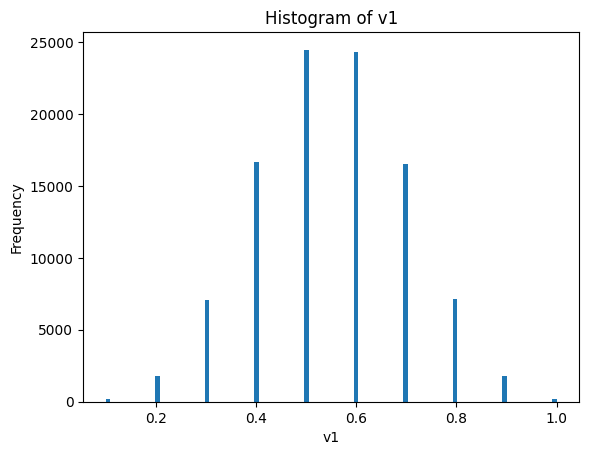

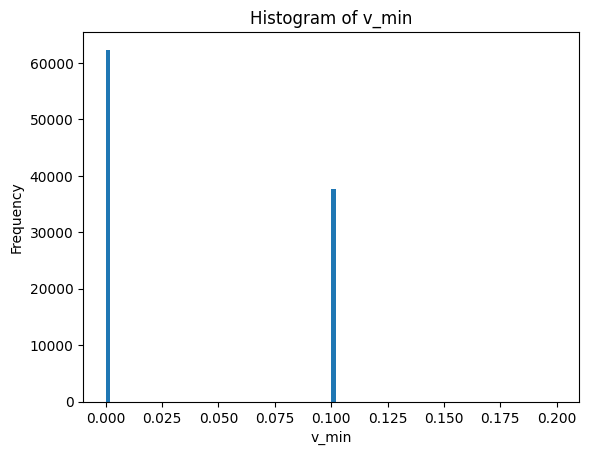

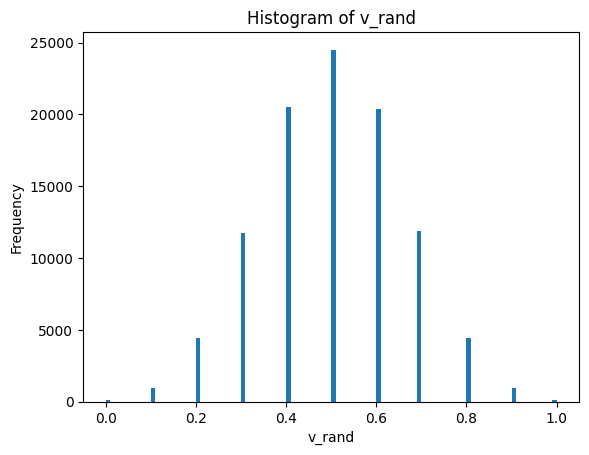

In [42]:
v1_list = []
v_min_list = []
v_rand_list = []
n_bins = 100

# run the experiment 10^5 times
for i in range(10**5):
    v1 , v_min , v_rand = entire_experiment()
    v1_list.append(v1[1])
    v_min_list.append(v_min[1])
    v_rand_list.append(v_rand[1])
    
# draw the histogram for each of the 3 coins
plt.hist(v1_list,bins=n_bins)
plt.xlabel('v1')
plt.ylabel('Frequency')
plt.title('Histogram of v1')
plt.show()

plt.hist(v_min_list,bins=n_bins)
plt.xlabel('v_min')
plt.ylabel('Frequency')
plt.title('Histogram of v_min')
plt.show()

plt.hist(v_rand_list,bins=n_bins)
plt.xlabel('v_rand')
plt.ylabel('Frequency')
plt.title('Histogram of v_rand')
plt.show()

### Exercise 1.10 (c)

In [43]:
# this fucntion to calculate Hoeffding inequality
def hoeffding_inequality(epslion,n):
    return 2*np.exp(-2*(epslion**2)*n)

In [44]:
# this function is to calculate the actual error
def actual_error(v,epsilon):
    return (abs(v-MU) > epsilon).mean()

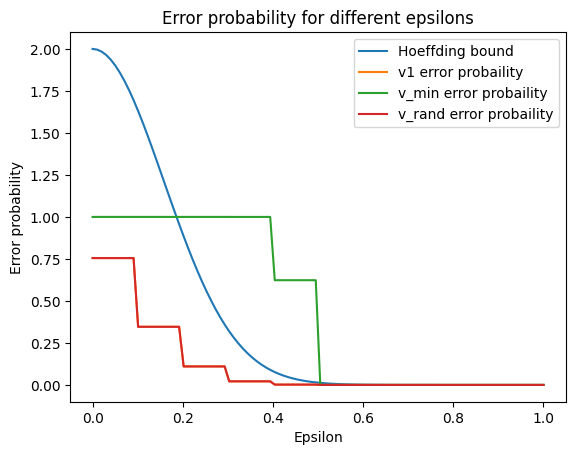

In [45]:
# TODO: add solution for point c

# create a list of epsilons from 0 to 1 with 100 elements in total 
espilons = np.linspace(0,1,100)

hoeffding_inequality_list = []
actual_error_v1 = []
actual_error_v_min = []
actual_error_v_rand = []
for espilon in espilons:
    hoeffding_inequality_list.append(hoeffding_inequality(espilon,N_FLIPS))
    actual_error_v1.append(actual_error(np.array(v1_list),espilon))
    actual_error_v_min.append(actual_error(np.array(v_min_list),espilon))
    actual_error_v_rand.append(actual_error(np.array(v_rand_list),espilon))
    
# draw the graph of Hoeffding inequality, and the actual error for each of the 3 coins
plt.plot(espilons,hoeffding_inequality_list,label="Hoeffding bound")
plt.plot(espilons,actual_error_v1,label="v1 error probaility")
plt.plot(espilons,actual_error_v_min,label="v_min error probaility")
plt.plot(espilons,actual_error_v_rand,label="v_rand error probaility")
plt.xlabel('Epsilon')
plt.ylabel('Error probability')
plt.title('Error probability for different epsilons')
plt.legend(loc='upper right')
plt.show()




### Exercise 1.10 (d)

In [46]:
# TODO: add solution for point d
''' 
as shown in the plot v_1 and v_rand obey the Hoeffding bound but v_min does not obey the Hoeffding bound 
because it is the minimum of the samples so it will be the farthest from the mean of the population which is 0.5
'''

' \nas shown in the plot v_1 and v_rand obey the Hoeffding bound but v_min does not obey the Hoeffding bound \nbecause it is the minimum of the samples so it will be the farthest from the mean of the population which is 0.5\n'

### Exercise 1.10 (e)

In [ ]:
# TODO: add solution for point e
'''
The mapping from the coins to the bins is as follows:
    c_1: is the bin that gives the first red ball
    c_min: is the bin that gives the minimum number of red balls
    c_rand: is the bin that is chosen randomly

    so flipping a coin is like choosing a ball from the bin and the color of the ball is the result of the flip
    and the fraction of red balls in the bin is the fraction of heads in the coin
    and the mean of the population is the mean of the color of the balls in the bin
'''

## Problem 1.4

### Problem 1.4 (a)

In [59]:
def generate_dataset(n,d,max = 100 , min = -100,seed=0):
    # TODO:  Generate a linearly separable data set of size 20 where d=2
    np.random.seed(seed)
    # generate random weights
    perceptron_weights = np.random.rand(d+1)
    
    # generate random points
    X = np.random.rand(n,d) * (max - min) + min #values between min and max
    
    # Add a column of ones for the bias term
    X = np.hstack((np.ones((n, 1)), X))
    # Calculate labels for each data point using the target function
    Y = np.sign(np.dot(X,perceptron_weights))
    
    return X,Y,perceptron_weights

In [60]:
def plot_data_points(x,y,x_label,y_label,title):
    plt.scatter(x[y == 1, 1], x[y == 1, 2], label="y = 1", color='red')
    plt.scatter(x[y == -1, 1], x[y == -1, 2], label="y = -1", color='blue')
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend(loc='upper right')


In [61]:
def plot_function(x,weights,label):
    # w2 * x2 + w1 * x1 + w0 = 0
    plt.plot(x, (-weights[0]-weights[1]*x)/weights[2], label=label)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Target function')
    plt.legend(loc='upper right')


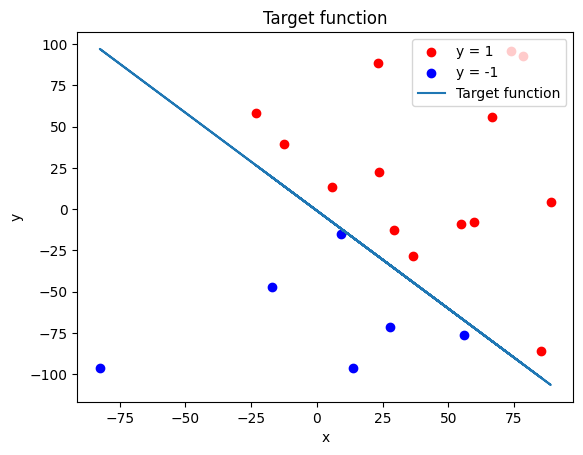

In [62]:
# generate the dataset
X,Y,random_weights = generate_dataset(20,2)

# plot the data points
plot_data_points(X,Y,'x1','x2','Data points')

# plot the target function
plot_function(X[:,1],random_weights,'Target function')

plt.show()


### Problem 1.4 (b)

In [69]:
def run_perceptron_learning(d,X,Y):
    # TODO: add perceptron learning algorithm code
    # initialize the weights to zero
    W = np.zeros(shape=(d + 1))
    
    # initialize the number of updates to zero
    number_of_updates = 0
    
    while True:
        # get the misclassified points
        misclassified_points = X[np.sign(np.dot(X,W)) * Y <=0]
        
        # if there are no misclassified points then break
        if len(misclassified_points) == 0:
            break
        
        # choose a random misclassified point
        random_misclassified_point = random.choice(misclassified_points)
        
        # update the weights
        W = W + random_misclassified_point[1] * random_misclassified_point[0]
        
        # increase the number of updates
        number_of_updates += 1
        
    return W,number_of_updates

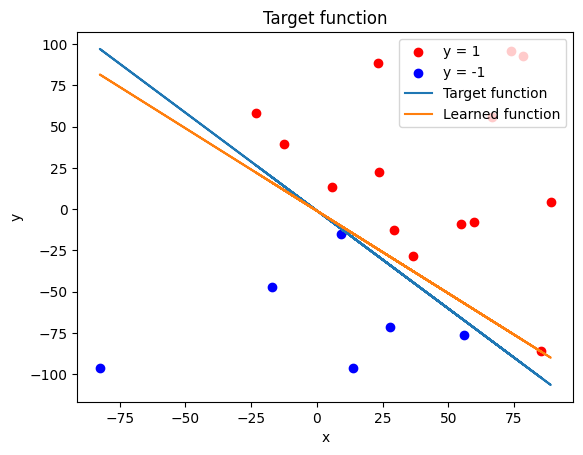

In [70]:
# run the perceptron learning algorithm
perceptron_weights,number_of_updates = run_perceptron_learning(2,X,Y)

# plot the data points
plot_data_points(X,Y,'x1','x2','Data points')

# plot the target function
plot_function(X[:,1],random_weights,'Target function')

# plot the function learned by the perceptron learning algorithm
plot_function(X[:,1],perceptron_weights,'Learned function')
plt.show()


In [71]:
# TODO: add solution for the rest of the point
print("number of updates: ", number_of_updates)
'''  
- the number of updates is 1 which means that the perceptron learning algorithm was able to find the target function
- f is close to g as shown in the plot
'''

number of updates:  1


'  \n- the number of updates is 1 which means that the perceptron learning algorithm was able to find the target function\n- f is close to g as shown in the plot\n'

### Problem 1.4 (c)

In [73]:
# TODO: add solution for point c : repeat the solutoin of b for random dataset
# generate the dataset
X,Y,random_weights = generate_dataset(20,2,seed=10)

# run the perceptron learning algorithm
perceptron_weights,number_of_updates = run_perceptron_learning(2,X,Y)

# plot the data points
plot_data_points(X,Y,'x1','x2','Data points')

# plot the target function
plot_function(X[:,1],random_weights,'Target function')

# plot the function learned by the perceptron learning algorithm
plot_function(X[:,1],perceptron_weights,'Learned function')
plt.show()


print("number of updates: ", number_of_updates)
'''  
- the number of updates is 
- f is close to g as shown in the plot
'''

### Problem 1.4 (d)

In [ ]:
# TODO: add solution for point d: Repeat everything in (b) with another randomly generated data set of size 100. Compare your results with (b).
# generate the dataset
X,Y,random_weights = generate_dataset(100,2)

# run the perceptron learning algorithm
perceptron_weights,number_of_updates = run_perceptron_learning(2,X,Y)

# plot the data points
plot_data_points(X,Y,'x1','x2','Data points')

# plot the target function
plot_function(X[:,1],random_weights,'Target function')

# plot the function learned by the perceptron learning algorithm
plot_function(X[:,1],perceptron_weights,'Learned function')

plt.show()

print("number of updates: ", number_of_updates)
'''  
- the number of updates is 
- f is close to g as shown in the plot
'''

### Problem 1.4 (e)

In [ ]:
# TODO: add solution for point e
'''
Repeat everything in (b) with another randomly generated data set of size 1,000.
Compare your results with (b).
'''
# generate the dataset
X,Y,random_weights = generate_dataset(1000,2)

# run the perceptron learning algorithm
perceptron_weights,number_of_updates = run_perceptron_learning(2,X,Y)

# plot the data points
plot_data_points(X,Y,'x1','x2','Data points')

# plot the target function
plot_function(X[:,1],random_weights,'Target function')

# plot the function learned by the perceptron learning algorithm
plot_function(X[:,1],perceptron_weights,'Learned function')

plt.show()

print("number of updates: ", number_of_updates)
'''
- the number of updates is
- f is close to g as shown in the plot
'''

### Problem 1.4 (f)

In [ ]:
'''
Modify the algorithm such that it takes d=10 instead of 2. Randomly generate a linearly
separable data set of size 1,000 and feed the data set to the algorithm. How many
updates does the algorithm take to converge?
'''
# generate the dataset
X,Y,random_weights = generate_dataset(1000,10)

# run the perceptron learning algorithm
perceptron_weights,number_of_updates = run_perceptron_learning(10,X,Y)

# plot the data points
plot_data_points(X,Y,'x1','x2','Data points')

# plot the target function
plot_function(X[:,1],random_weights,'Target function')

# plot the function learned by the perceptron learning algorithm
plot_function(X[:,1],perceptron_weights,'Learned function')

plt.show()

print("number of updates: ", number_of_updates)
'''
- the number of updates is
- The number of updates is very high compared to the previous cases
'''


### Problem 1.4 (g)


In [ ]:
'''
Repeat the algorithm on the same data set as (f) for 100 experiments. In the iterations of
each experiment, pick x(t) randomly instead of deterministically. Plot a histogram for the
number of updates that the algorithm takes to converge.
'''
# run the perceptron learning algorithm 100 times
number_of_updates_list = []
for i in range(100):
    # permute the data points
    permuted_indices = np.random.permutation(len(X))
    X = X[permuted_indices]
    Y = Y[permuted_indices]
    # run the perceptron learning algorithm
    perceptron_weights,number_of_updates = run_perceptron_learning(10,X,Y)
    number_of_updates_list.append(number_of_updates)
    
# draw the histogram for the number of updates
plt.hist(number_of_updates_list,bins=100)
plt.xlabel('Number of updates')
plt.ylabel('Frequency')
plt.title('Histogram of the number of updates')
plt.show()


<b>Comment on (g):</b>
The number of dimensions and number of training examples don't affect the accuracy in terms of the number of 
correctly classified points. But in terms of generalization, the number of training examples makes 
g closer to f and this also can be concluded from hoefding's inequality. Inceasing the number of training 
examples makes the sample average closer to the population average.

Increasing the number of training examples makes increases the time complexity of the algorithm , because it in general makes 
the number of updates higher.

Increasing the number of dimensions makes the time complexity of the algorithm higher, because it requires more computations to 
calculate the dot product of the weights and the data point.
'''